# **Machine Vision Project: GANs**

Deep neural networks are used mainly for supervised learning: classification or regression. Generative Adversarial Networks or GANs, however, use neural networks for a very different purpose: Generative modeling.

While there are many approaches used for generative modeling ex: DCGAN, WGAN..., a Generative Adversarial Network have a generator and discriminator.
The generator generates a "fake" sample given a random vector/matrix, and the discriminator attempts to detect whether a given sample is "real" (picked from the training data) or "fake" (generated by the generator). Training happens in tandem: we train the discriminator for a few epochs, then train the generator for a few epochs, and repeat. This way both the generator and the discriminator get better at doing their jobs.

In this project we'll try to generate and then classify a set of Horses and Cows images.


Importing libraries that we will use in this project

In [ ]:
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
from torchvision import datasets
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.use_deterministic_algorithms(True) # Needed for reproducible results

Random Seed:  999


We will use summary library to visualize our neural networks better and gets some test to see how the outputs will look like

In [ ]:
# For seeing the neural networks inputs and outputs and sizes
from torchsummary import summary

Define some inputs for the project

*   workers - the number of worker threads for loading the data with the DataLoader.
*   batch_size - the batch size used in training.
*   image_size - the spatial size of the images used for training.
*   nc - number of color channels in the input images. For color images this is 3.
*   nz - length of latent vector.
*   ngf - relates to the depth of feature maps carried through the generator.
*   ndf - sets the depth of feature maps propagated through the discriminator.
*   lr - learning rate for training. As described in the DCGAN paper, this number should be 0.0002.
*   beta1 - beta1 hyperparameter for Adam optimizers. As described in paper, this number should be 0.5.
*   ngpu - number of GPUs available. If this is 0, code will run in CPU mode. If this number is greater than 0 it will run on that number of GPUs.


In [ ]:
# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 1

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. latent size)
nz = 10

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

Connecting to google drive to import the dataset

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**Using GPU**

To seamlessly use a GPU, we'll implement this code below and use it in our code

In [ ]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

**Loading Data**

Let's load this dataset using a custom class CustomImageDataset. We will also resize and crop the images to 64x64 px, and normalize the pixel values with a mean & standard deviation of 0.5 for each channel. This will ensure that pixel values are in the range (-1, 1), which is more convenient for training the discriminator. We will also create a data loader to load the data in batches.

The data set is in two separated files Train and Test folders in each file there are two other files Horse and Cow files, for classifier we'll take all the Train file to use it for classification, for the GANs part we'll take horses images and cows images separatly to enhance the accuracy of the generator and descriminator to get better results

In [ ]:
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [ ]:
import os
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image  # Assuming you use PIL to handle images

class CustomImageDataset(Dataset):
    def __init__(self, img_dir, transform=None, target_transform=None):
        self.img_dir = img_dir
        self.transform = transform
        self.target_transform = target_transform
        self.img_paths = [os.path.join(self.img_dir, img_name) for img_name in os.listdir(self.img_dir)]

        # Determine labels based on directory name
        self.img_labels = [1 if os.path.basename(self.img_dir) == 'Cow' else 0] * len(self.img_paths)

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        img_path = self.img_paths[idx]
        img = Image.open(img_path).convert('RGB')  # Open image and convert to RGB
        label = self.img_labels[idx]

        if self.transform:
            img = self.transform(img)

        if self.target_transform:
            label = self.target_transform(label)

        return img, label

# Define transformations
transform1 = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(*stats),
])



# Paths to horse and cow training directories
CowTrainPath = '/content/drive/MyDrive/Newdata/Train/Cow'
HorseTrainPath = '/content/drive/MyDrive/Newdata/Train/Horse'

# Create custom datasets and data loaders for cows and horses
CowTrainSet = CustomImageDataset(CowTrainPath, transform=transform1)
HorseTrainSet = CustomImageDataset(HorseTrainPath, transform=transform1)

Cow_loader = torch.utils.data.DataLoader(CowTrainSet, batch_size=batch_size, shuffle=True, num_workers=2)
Horse_loader = torch.utils.data.DataLoader(HorseTrainSet, batch_size=batch_size, shuffle=True, num_workers=2)

print(f"Length of Cows training dataset: {len(Cow_loader.dataset)}")

train_image_datasets = datasets.ImageFolder(root= "/content/drive/My Drive/Newdata/Train", transform=transform1)
test_image_datasets = datasets.ImageFolder(root= "/content/drive/My Drive/Newdata/Test", transform=transform1)
train_loaders = torch.utils.data.DataLoader(train_image_datasets, batch_size=batch_size, shuffle=True, num_workers=2)
test_loaders = torch.utils.data.DataLoader(test_image_datasets, batch_size=batch_size, shuffle=False, num_workers=2)

Length of Cows training dataset: 41


Let's display some sample images from a our data set.

In [ ]:
from torchvision.utils import make_grid
def denorm(img_tensors):
  return img_tensors * stats[1][0] + stats[0][0]

In [ ]:
def show_images(images, nmax=64):
  fig, ax = plt. subplots (figsize=(8, 8))
  ax.set_xticks([]); ax.set_yticks([])
  ax.imshow(make_grid(denorm(images.detach()[ :nmax]), nrow=8).permute (1, 2, 0))

def show_batch(dl, nmax = 64):
  for images,_ in dl:
    show_images(images, nmax)
    break

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


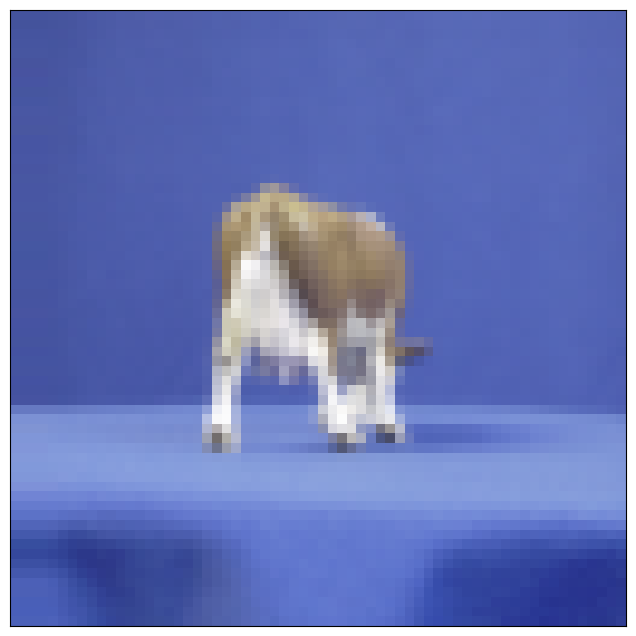

In [ ]:
show_batch(Cow_loader)

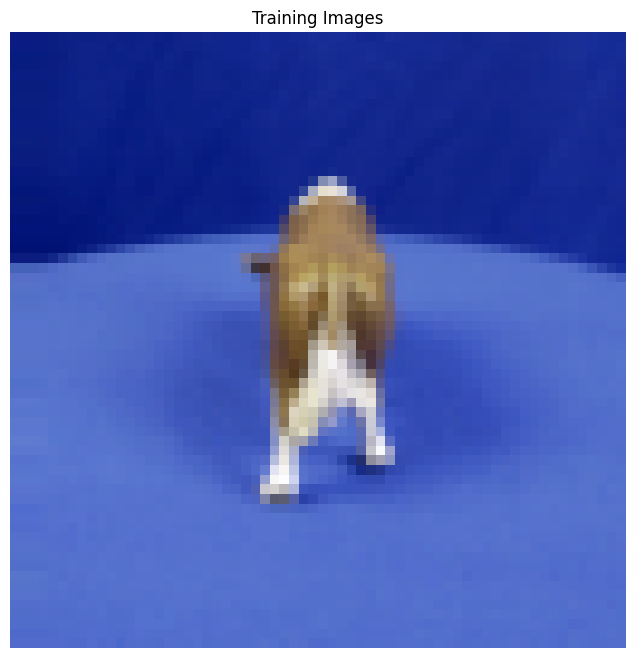

In [ ]:
# Plot some training images
real_batch = next(iter(Cow_loader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

# Implementing the generator and discriminator and their trainer

With our input parameters set and the dataset prepared, we can now get into the implementation. We will start with the weight initialization strategy, then talk about the generator, discriminator, loss functions, and training loop in detail.



All model weights shall be randomly initialized from a Normal distribution with mean=0, stdev=0.02. The weights_init function takes an initialized model as input and reinitializes all convolutional, convolutional-transpose, and batch normalization layers to meet this criteria. This function is applied to the models immediately after initialization.



In [ ]:
# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

**Generator**

The input to the generator is typically a vector or a matrix of random numbers (referred to as a latent tensor) which is used as a seed for generating an image. The generator will convert a latent tensor of shape (128, 1, 1) into an image tensor of shape 3 x 28 x 28. To achive this, we'll use the ConvTranspose2d layer from PyTorch, which is performs to as a transposed convolution

In [ ]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, input):
        return self.main(input)

We use the TanH activation function for the output layer of the generator.

Now, we can instantiate the generator and apply the weights_init function. We'll use the summary function to visualize how is the generator object is structured, we'll give it an input of (100,1,1) since the input is just a noise

In [ ]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
#  to ``mean=0``, ``stdev=0.02``.
netG.apply(weights_init)

# Print the model
print(netG)

summary(netG,(10,1,1))

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(10, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)
-

**Discriminator**

The discriminator takes an image as input, and tries to classify it as "real" or "generated". In this sense, it's like any other neural network. We'll use a convolutional neural networks (CNN) which outputs a single number output for every image. We'll use stride of 2 to progressively reduce the size of the output feature map.

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is ``(nc) x 64 x 64``
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

Same thing with the discriminator, except this time when using the summary function to visualize how is the discriminator object is structured the inputs to the network will be of size (3, 64, 64) since the image we'll give is RGB image with size 64x64

In [ ]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
netD.apply(weights_init)

# Print the model
print(netD)

summary(netD,(3,64,64))

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)
------------------------------

In [ ]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

Save samples

In [ ]:
from torchvision.utils import save_image
import os

In [ ]:
sample_dir = "generator"
os.makedirs(sample_dir, exist_ok = True)

In [ ]:

def save_samples(index, latent_tensors, show=True):
    latent_tensors = latent_tensors.to(device)
    fake_images = netG(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [ ]:
fixed_latent = torch.randn(64, 10, 1, 1)

Saving generated-images-0000.png


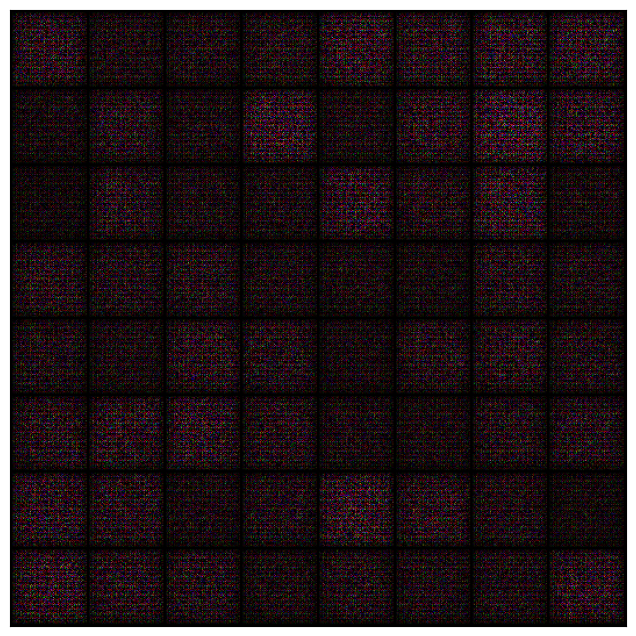

In [ ]:
save_samples(0, fixed_latent.to(device))

In [ ]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0
num_epochs = 200
start_idx=1

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(Cow_loader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(Cow_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            # Save generated images
            save_samples(epoch+start_idx, fixed_latent, show=False)

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(Cow_loader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/100][0/41]	Loss_D: 1.4821	Loss_G: 10.2681	D(x): 0.2773	D(G(z)): 0.1808 / 0.0000
Saving generated-images-0001.png
[1/100][0/41]	Loss_D: 0.2375	Loss_G: 12.3187	D(x): 1.0000	D(G(z)): 0.2114 / 0.0000
Saving generated-images-0002.png
[2/100][0/41]	Loss_D: 0.0013	Loss_G: 5.8154	D(x): 1.0000	D(G(z)): 0.0013 / 0.0030
Saving generated-images-0003.png
[3/100][0/41]	Loss_D: 5.1093	Loss_G: 21.5318	D(x): 0.0060	D(G(z)): 0.0000 / 0.0000
Saving generated-images-0004.png
[4/100][0/41]	Loss_D: 0.0203	Loss_G: 4.6213	D(x): 0.9979	D(G(z)): 0.0180 / 0.0098
Saving generated-images-0005.png
[5/100][0/41]	Loss_D: 0.0156	Loss_G: 2.5475	D(x): 1.0000	D(G(z)): 0.0155 / 0.0783
Saving generated-images-0006.png
[6/100][0/41]	Loss_D: 0.0000	Loss_G: 17.4527	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
Saving generated-images-0007.png
[7/100][0/41]	Loss_D: 0.0019	Loss_G: 9.1145	D(x): 0.9984	D(G(z)): 0.0004 / 0.0001
Saving generated-images-0008.png
[8/100][0/41]	Loss_D: 0.0011	Loss_G: 12.0055	D(x):

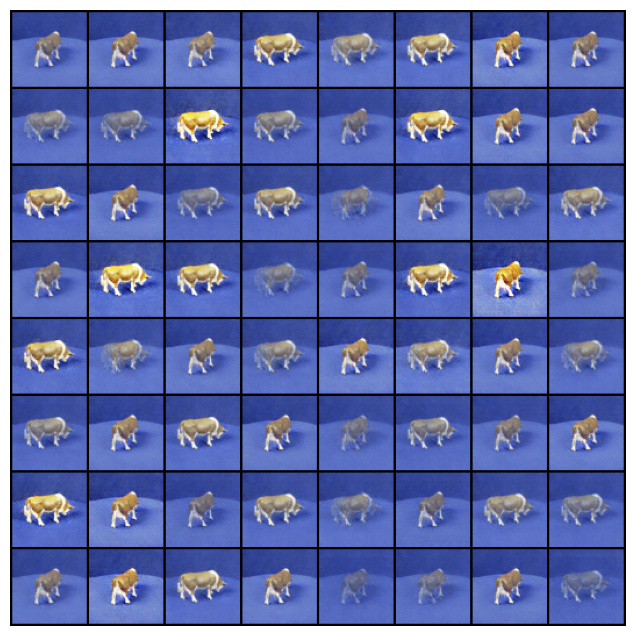

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

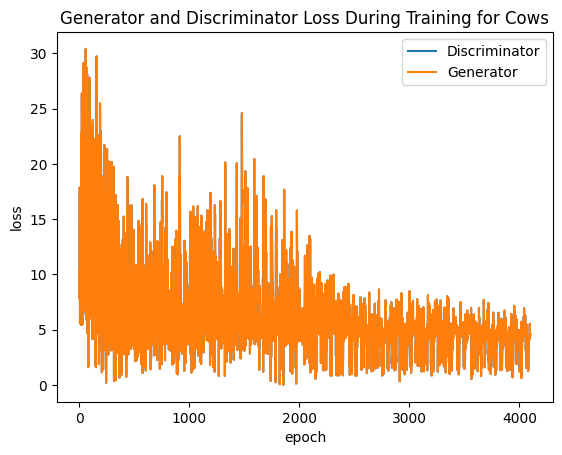

In [ ]:
plt.plot(G_losses, '-')
plt.plot(G_losses, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('enerator and Discriminator Loss During Training for Cows');

Save **model**

In [ ]:
torch.save(netG.state_dict(), 'CowsG.pth')
torch.save(netD.state_dict(), 'CowsD.pth')

generate some images to save it for the data set

torch.Size([1, 3, 64, 64])


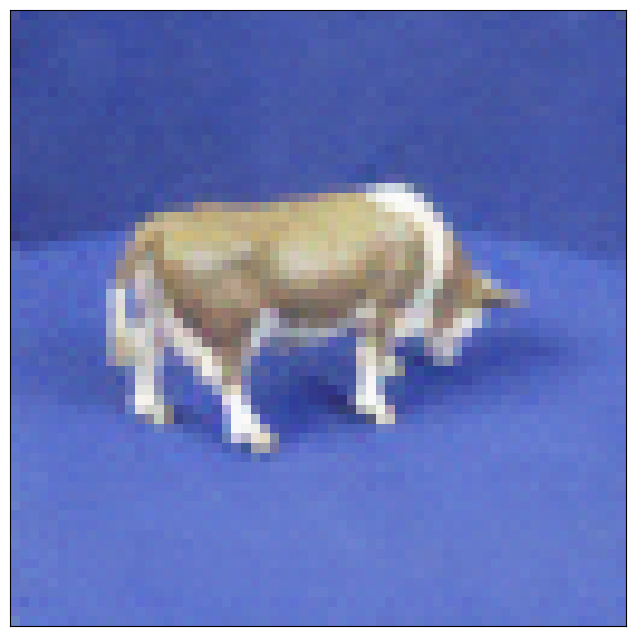

In [ ]:
xb = torch.randn(batch_size, nz, 1, 1).to(device) # random latent tensors
fake_images = netG(xb)
print(fake_images.shape)
show_images(fake_images.cpu())

**Horses genertaion**

In [ ]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0
num_epochs = 200
start_idx=1

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(Horse_loader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(Cow_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            # Save generated images
            save_samples(epoch+start_idx, fixed_latent, show=False)

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(Cow_loader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[0/200][0/41]	Loss_D: 0.8401	Loss_G: 3.9200	D(x): 0.4362	D(G(z)): 0.0104 / 0.0198
Saving generated-images-0001.png
[1/200][0/41]	Loss_D: 0.0001	Loss_G: 11.4081	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
Saving generated-images-0002.png
[2/200][0/41]	Loss_D: 6.1486	Loss_G: 4.6811	D(x): 0.0021	D(G(z)): 0.0034 / 0.0093
Saving generated-images-0003.png
[3/200][0/41]	Loss_D: 2.2056	Loss_G: 2.3756	D(x): 0.9749	D(G(z)): 0.8870 / 0.0930
Saving generated-images-0004.png
[4/200][0/41]	Loss_D: 0.0233	Loss_G: 4.6253	D(x): 0.9989	D(G(z)): 0.0219 / 0.0098
Saving generated-images-0005.png
[5/200][0/41]	Loss_D: 1.4427	Loss_G: 5.9450	D(x): 0.9996	D(G(z)): 0.7636 / 0.0026
Saving generated-images-0006.png
[6/200][0/41]	Loss_D: 0.4048	Loss_G: 4.1767	D(x): 0.6738	D(G(z)): 0.0099 / 0.0153
Saving generated-images-0007.png
[7/200][0/41]	Loss_D: 0.0991	Loss_G: 3.9457	D(x): 0.9924	D(G(z)): 0.0875 / 0.0193
Saving generated-images-0008.png
[8/200][0/41]	Loss_D: 1.4734	Loss_G: 1.3997	D(x): 0.4112	D(G(z)): 0.4428 / 0.24

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

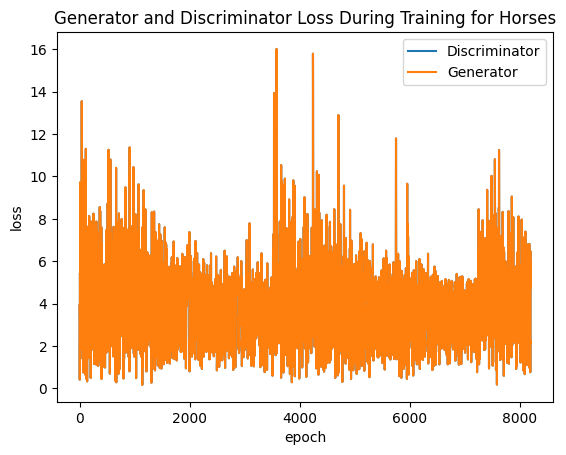

In [ ]:
plt.plot(G_losses, '-')
plt.plot(G_losses, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('enerator and Discriminator Loss During Training for Horses');

# **Classifier**

In [ ]:
import torch.nn as nn
from torchsummary import summary

class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=(4, 4))
        self.pool = nn.MaxPool2d(kernel_size=4)
        self.dropout = nn.Dropout(0.2)
        self.conv2 = nn.Conv2d(32, 8, kernel_size=(2, 2))
        self.pool2 = nn.MaxPool2d(kernel_size=2)
        self.relu = nn.ReLU()
        self.conv3 = nn.Conv2d(8, 8, kernel_size=(2, 2))
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(8 * 30 * 30, 176)
        self.fc2 = nn.Linear(176, 2)


    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.dropout(x)
        x = self.pool(x)
        x = self.relu(self.conv2(x))
        x = self.dropout(x)
        x = self.pool2(x)
        x = self.relu(self.conv3(x))
        x = self.fc1(self.flatten(x))
        x = nn.functional.softmax(self.fc2(x), dim=1)

        return x

# Instantiate the model
net = Net()
print(net)
summary(net, (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 61, 61]           1,568
              ReLU-2           [-1, 32, 61, 61]               0
           Dropout-3           [-1, 32, 61, 61]               0
         MaxPool2d-4           [-1, 32, 15, 15]               0
            Conv2d-5            [-1, 8, 14, 14]           1,032
              ReLU-6            [-1, 8, 14, 14]               0
           Dropout-7            [-1, 8, 14, 14]               0
         MaxPool2d-8              [-1, 8, 7, 7]               0
            Conv2d-9              [-1, 8, 6, 6]             264
             ReLU-10              [-1, 8, 6, 6]               0
          Flatten-11                  [-1, 288]               0
           Linear-12                  [-1, 176]          50,864
             ReLU-13                  [-1, 176]               0
           Linear-14                   

In [ ]:
def train_nn(model, train_loader, test_loader, criterion, optimizer, n_epochs):

  for epoch in range(n_epochs):
    print("Epoch number %d" % (epoch + 1))
    model. train ()
    running_loss = 0.0
    running_correct = 0.0
    total = 0

    for data in train_loader:
      images, labels = data
      # images, labels = images.to(device), labels.to(device)
      total += labels.size(0)

      optimizer.zero_grad()

      outputs = model(images)
      _, predicted = torch.max(outputs.data, 1)

      loss = criterion(outputs, labels)
      loss.backward()

      optimizer.step()

      running_loss += loss.item()

      # print("--DEBUG: running loss %.2f " %(running_loss))
      running_correct += (labels == predicted).sum().item()

    epoch_loss = running_loss / len(train_loader)
    epoch_accuracy = 100 * running_correct / total

    print ("   - Training dataset. Got %d out of %d images correctly (%.3f88). Epoch loss: %.3f" % (running_correct, total, epoch_accuracy, epoch_loss))

    evaluate_model_on_test_set(model, test_loader)

  print("Finished")

  return model

In [ ]:
def evaluate_model_on_test_set(model, test_loader):
  model.eval()
  predicted_correctly_on_epoch = 0
  total = 0

  with torch.no_grad():
    for data in test_loader:
      images, labels = data
      images = images.to(device)
      labels = labels.to(device)
      total += labels.size(0)

      outputs = model(images)
      _, predicted = torch.max(outputs.data, 1)

      predicted_correctly_on_epoch += (predicted == labels).sum().item()
      epoch_accuracy = 100 * predicted_correctly_on_epoch / total


  epoch_acc = 100.0 * predicted_correctly_on_epoch / total
  print ("   - Testing dataset. Got %d out of %d images correctly (%.3f88)" % (predicted_correctly_on_epoch, total, epoch_accuracy))

In [ ]:
loss_fn = nn.BCELoss()
optimizer = torch.optim.Adam(net.parameters(), lr=lr)
train_nn(net, train_loaders, test_loaders, loss_fn, optimizer, num_epochs)

Epoch number 1


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


   - Training dataset. Got 50 out of 82 images correctly (60.97688). Epoch loss: 0.680
   - Testing dataset. Got 26 out of 67 images correctly (38.80688)
Epoch number 2
   - Training dataset. Got 79 out of 82 images correctly (96.34188). Epoch loss: 0.430
   - Testing dataset. Got 33 out of 67 images correctly (49.25488)
Epoch number 3
   - Training dataset. Got 81 out of 82 images correctly (98.78088). Epoch loss: 0.107
   - Testing dataset. Got 27 out of 67 images correctly (40.29988)
Epoch number 4
   - Training dataset. Got 81 out of 82 images correctly (98.78088). Epoch loss: 0.041
   - Testing dataset. Got 27 out of 67 images correctly (40.29988)
Epoch number 5
   - Training dataset. Got 82 out of 82 images correctly (100.00088). Epoch loss: 0.016
   - Testing dataset. Got 28 out of 67 images correctly (41.79188)
Epoch number 6
   - Training dataset. Got 82 out of 82 images correctly (100.00088). Epoch loss: 0.007
   - Testing dataset. Got 27 out of 67 images correctly (40.29988)

Net(
  (conv1): Conv2d(3, 32, kernel_size=(4, 4), stride=(1, 1))
  (pool): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (dropout): Dropout(p=0.2, inplace=False)
  (conv2): Conv2d(32, 8, kernel_size=(2, 2), stride=(1, 1))
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (relu): ReLU()
  (conv3): Conv2d(8, 8, kernel_size=(2, 2), stride=(1, 1))
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc1): Linear(in_features=288, out_features=176, bias=True)
  (fc2): Linear(in_features=176, out_features=2, bias=True)
)